In [1]:
import os
import errno

import numpy as np

import deepcell

from deepcell.utils.data_utils import get_data

from __future__ import absolute_import
from __future__ import print_function
from __future__ import division

import datetime
import os
import sys
import getopt
import errno
import math
import numpy as np
from tensorflow.python.keras import backend as K
from tensorflow.python.keras import callbacks
from tensorflow.python.keras.losses import mean_squared_error
from tensorflow.python.keras.optimizers import SGD, Adam

from tensorflow.python.keras.utils.data_utils import get_file

import deepcell
from deepcell import losses
from deepcell import image_generators
from deepcell import model_zoo
from deepcell import stack_generator

from deepcell.utils import train_utils
from deepcell.utils.data_utils import get_data
from deepcell.utils.train_utils import rate_scheduler

from sklearn.model_selection import train_test_split
from tensorflow.python.keras.initializers import RandomNormal


from tensorflow.python.client import device_lib
from tensorflow.python.keras.models import Model
from __future__ import absolute_import
from __future__ import print_function
from __future__ import division

import copy

import tensorflow as tf

from tensorflow.python.keras import backend as K
from tensorflow.python.keras import applications
from tensorflow.python.keras import utils as keras_utils
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.layers import Input, Conv2D, Conv3D, BatchNormalization, Lambda, Concatenate
from tensorflow.python.keras.layers import Activation, MaxPool2D, MaxPool3D, Conv3DTranspose, Cropping3D, Conv2DTranspose
from tensorflow.python.keras.regularizers import l2

from deepcell.model_zoo.retinanet import retinanet_feature_extractor
from deepcell.layers import ReflectionPadding3D
from deepcell.layers.normalization import ImageNormalization3D, ImageNormalization2D
from deepcell.layers.upsample import UpsampleLike

import matplotlib.pyplot as plt
%matplotlib inline

MODEL_DIR = r'/notebooks/data/models'
LOG_DIR = r'/notebooks/data/logs'
DATA_DIR = r'/notebooks/data/augmented_microscopy/RAW264.7/data'
OUTPUT_DIR = r'/notebooks/data/outputs/retinanet_channel'
EXPORT_DIR = r'/notebooks/data/models/exports'

In [2]:
filename = 'dapi_256_nomostlyempty.npz'
#annotation_file = 'annotations_256_all_noempty.npz'
DATA_FILE = os.path.join(DATA_DIR, filename)

train_dict, test_dict = get_data(DATA_FILE, mode='conv', test_size=0.1, seed=0)

X_train, y_train, X_test, y_test = train_dict['X'], train_dict['y'], test_dict['X'], test_dict['y']

print(' -\nX.shape: {}\ny.shape: {}'.format(X_train.shape, y_train.shape))

 -
X.shape: (821, 61, 256, 256, 1)
y.shape: (821, 256, 256, 1)


In [6]:
from tensorflow.keras.optimizers import SGD, Adam
from deepcell.utils.train_utils import rate_scheduler

model_name = '{}_retinanet'.format(backbone)

n_epoch = 5  # Number of training epochs
test_size = .20  # % of data saved as test
lr = 1e-5

lr_sched = rate_scheduler(lr=lr, decay=0.99)

batch_size = 1

n_epoch = 5  # Number of training epochs
test_size = .10  # % of data saved as test
norm_method = 'whole_image'  # data normalization

optimizer = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)

lr_sched = rate_scheduler(lr=0.01, decay=0.99)

# Transformation settings
transform = 'identity' 

# 3D Settings
frames_per_batch = 61

In [7]:
from deepcell.utils.retinanet_anchor_utils import generate_anchor_params

# Pick and choose which backbone layers and anchors to use in training
# backbone_levels = ['C3', 'C4', 'C5']
# pyramid_levels = ['P3', 'P4']
# anchor_size_dict = {'P3': 32, 'P4': 64}

backbone_levels = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5']
pyramid_levels = ['P0']

In [9]:
model = am_model(
    feature_size=128,
    input_shape=(61, 256, 256, 1),
    backbone_levels=backbone_levels,
    pyramid_levels=pyramid_levels)

<class 'tensorflow.python.framework.ops.Tensor'>
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, N 0                                            
__________________________________________________________________________________________________
image_normalization3d (ImageNor (None, None, None, N 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv3d (Conv3D)                 (None, None, None, N 896         image_normalization3d[0][0]      
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, N 128         conv3d[0][0]                     
____________________________________________________________

In [10]:
from deepcell.training import train_model_am

model = train_model_am(
    model=model,
    train_dict=train_dict,
    test_dict=test_dict,
    model_name='am_resnet_model2',
    test_size=test_size,
    n_epoch=4,
    batch_size=1,
    optimizer=optimizer,
    frames_per_batch=61,
    transform=transform,
    model_dir=MODEL_DIR,
    log_dir=LOG_DIR,
    lr_sched=lr_sched,
    rotation_range=180,
    flip=True,
    shear=30)

X_train shape: (821, 61, 256, 256, 1)
y_train shape: (821, 256, 256, 1)
X_test shape: (92, 61, 256, 256, 1)
y_test shape: (92, 256, 256, 1)
Output Shape: (None, None, None, 1)
Number of Classes: 1
Training on 1 GPUs
Epoch 1/4
820/821 [============================>.] - ETA: 1s - loss: 2358023.6248 - acc: 0.0000e+00
Epoch 00001: val_loss improved from inf to 1888192.49762, saving model to /notebooks/data/models/am_resnet_model2.h5
821/821 [==============================] - 1471s 2s/step - loss: 2356502.1739 - acc: 0.0000e+00 - val_loss: 1888192.4976 - val_acc: 0.0000e+00
Epoch 2/4
820/821 [============================>.] - ETA: 1s - loss: 1678364.6700 - acc: 0.0000e+00
Epoch 00002: val_loss did not improve from 1888192.49762
821/821 [==============================] - 1450s 2s/step - loss: 1676510.7344 - acc: 0.0000e+00 - val_loss: 2637126.2208 - val_acc: 0.0000e+00
Epoch 3/4
820/821 [============================>.] - ETA: 1s - loss: 1436114.1082 - acc: 0.0000e+00
Epoch 00003: val_loss im

In [14]:
am_model_name = 'am_retinanet_model_learned_addbase_v5'
am_weights_file = os.path.join(MODEL_DIR, '{}.h5'.format(am_model_name))

In [15]:
model.save_weights(am_weights_file)

In [11]:
X_test = test_dict['X']#normalized_X_test
print(X_test.shape)
y_test = test_dict['y']#normalized_y_test
print(y_test.shape)

(92, 61, 256, 256, 1)
(92, 256, 256, 1)


In [12]:
predict_model = model

test_images = predict_model.predict(X_test[:1])
for index in range(1, X_test.shape[0]):
    print('shape:', test_images.shape)
    test_images = np.concatenate([test_images, predict_model.predict(X_test[index:index+1])])

print('shape:', test_images.shape)

shape: (1, 256, 256, 1)
shape: (2, 256, 256, 1)
shape: (3, 256, 256, 1)
shape: (4, 256, 256, 1)
shape: (5, 256, 256, 1)
shape: (6, 256, 256, 1)
shape: (7, 256, 256, 1)
shape: (8, 256, 256, 1)
shape: (9, 256, 256, 1)
shape: (10, 256, 256, 1)
shape: (11, 256, 256, 1)
shape: (12, 256, 256, 1)
shape: (13, 256, 256, 1)
shape: (14, 256, 256, 1)
shape: (15, 256, 256, 1)
shape: (16, 256, 256, 1)
shape: (17, 256, 256, 1)
shape: (18, 256, 256, 1)
shape: (19, 256, 256, 1)
shape: (20, 256, 256, 1)
shape: (21, 256, 256, 1)
shape: (22, 256, 256, 1)
shape: (23, 256, 256, 1)
shape: (24, 256, 256, 1)
shape: (25, 256, 256, 1)
shape: (26, 256, 256, 1)
shape: (27, 256, 256, 1)
shape: (28, 256, 256, 1)
shape: (29, 256, 256, 1)
shape: (30, 256, 256, 1)
shape: (31, 256, 256, 1)
shape: (32, 256, 256, 1)
shape: (33, 256, 256, 1)
shape: (34, 256, 256, 1)
shape: (35, 256, 256, 1)
shape: (36, 256, 256, 1)
shape: (37, 256, 256, 1)
shape: (38, 256, 256, 1)
shape: (39, 256, 256, 1)
shape: (40, 256, 256, 1)
shape: (4

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91


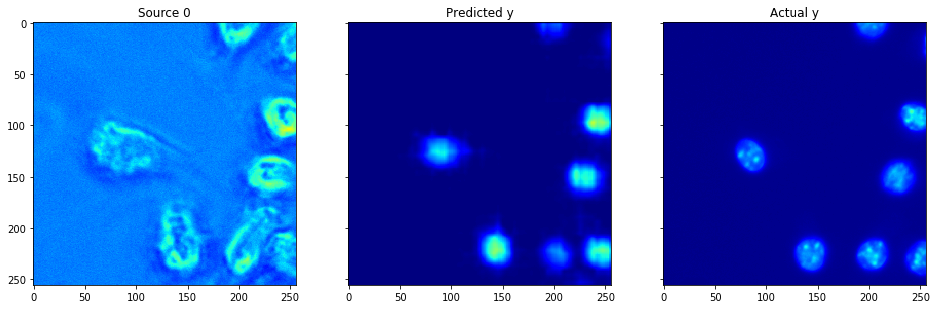

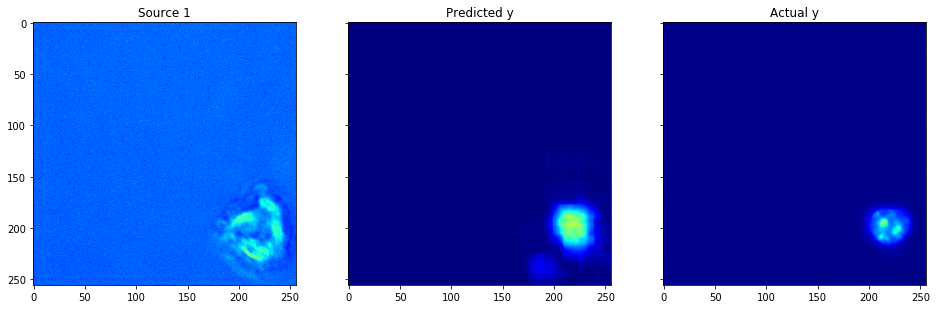

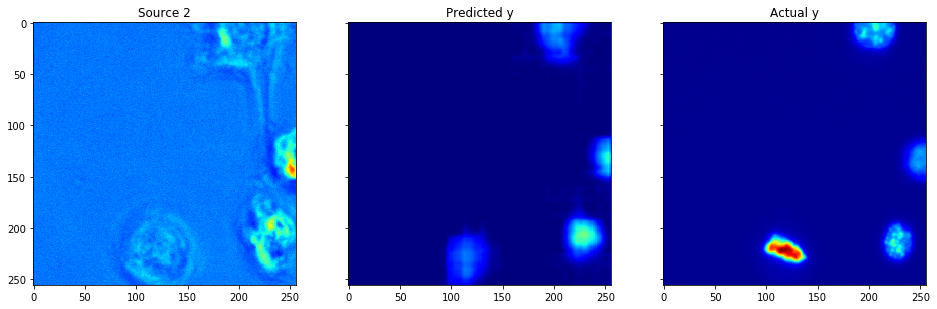

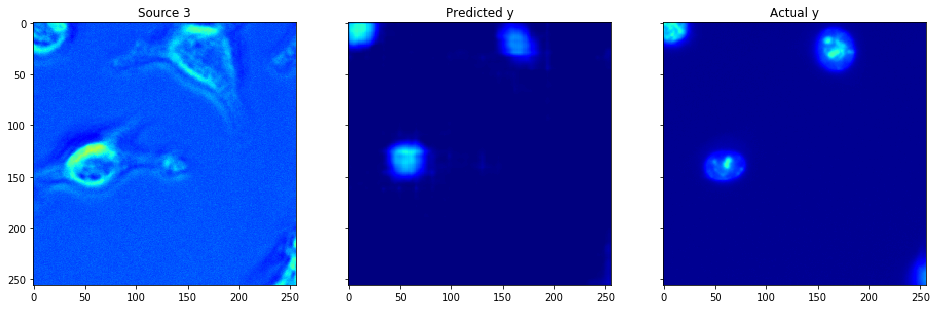

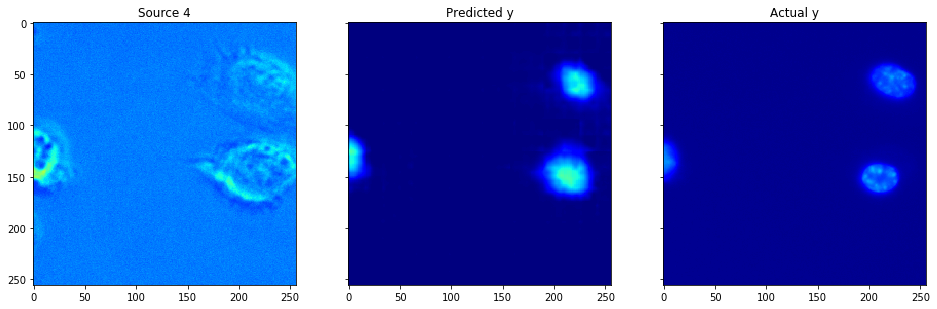

...

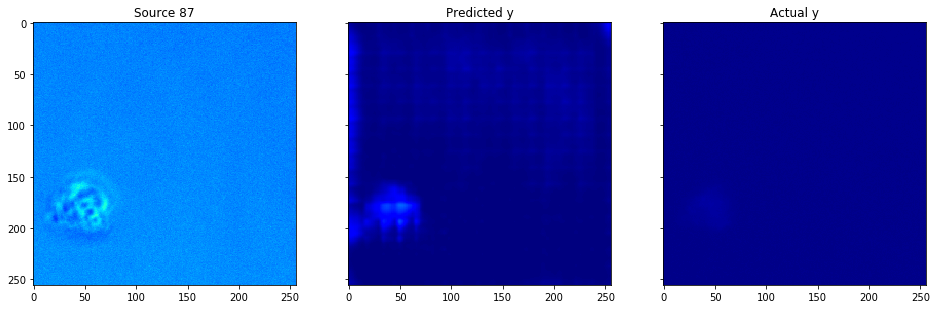

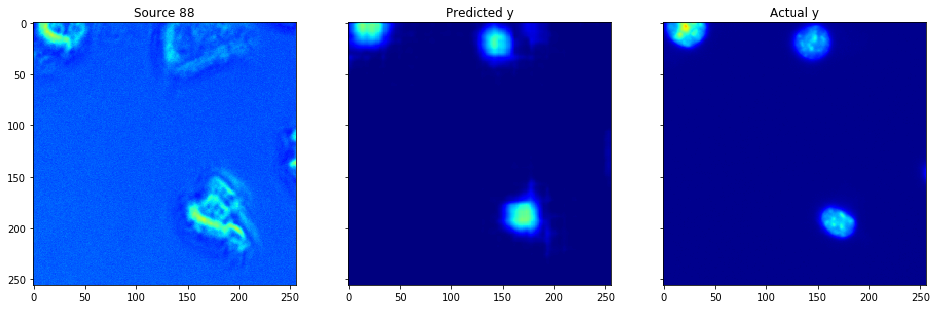

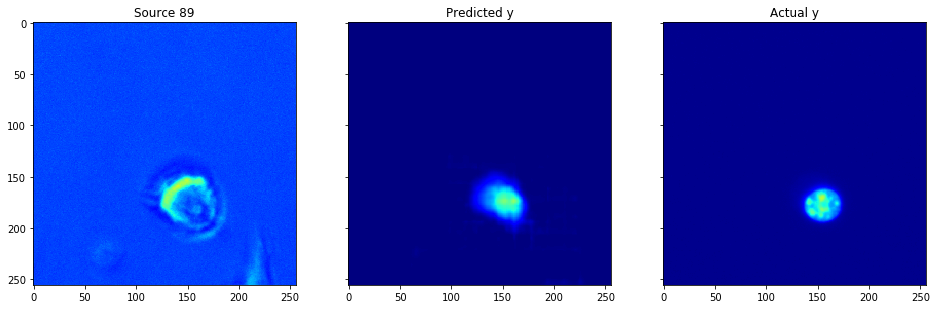

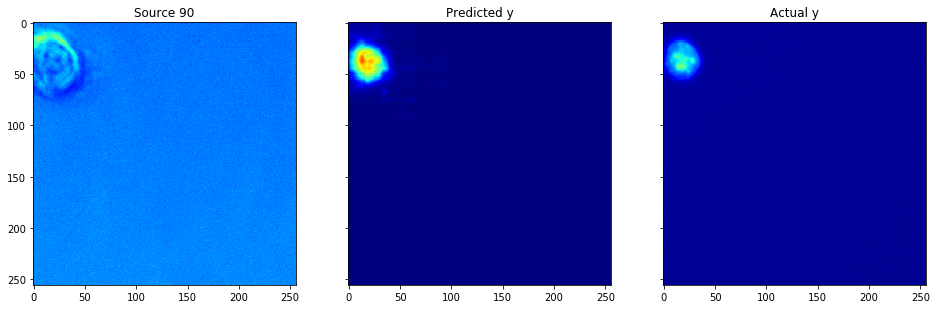

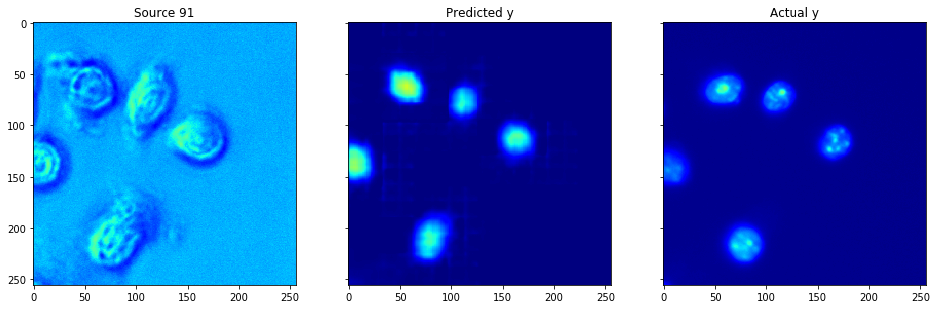

In [13]:
index = np.random.randint(low=0, high=X_test.shape[0])
#index = 54
frame = 5

source = X_test
predicted = test_images
actual = y_test

smin = source.min()
smax = source.max()
pmin = predicted.min()
pmax = predicted.max()
amin = actual.min()
amax = actual.max()

for index in range(0, X_test.shape[0]):
    print(index)

    fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(16, 16), sharex=True, sharey=True)

    ax = axes.ravel()

    ax[0].imshow(source[index, frame, ..., 0], cmap='jet', vmin=smin, vmax=smax)
    ax[0].set_title('Source ' + str(index))

    ax[1].imshow(predicted[index, :, :, 0], cmap='jet', vmin=pmin, vmax=pmax)
    ax[1].set_title('Predicted y')

    ax[2].imshow(y_test[index, :, :, 0], cmap='jet', vmin=amin, vmax=amax)
    ax[2].set_title('Actual y')

    #plt.savefig(os.path.join(OUTPUT_DIR, 'output_{}.png'.format(index)))
    
plt.show()

In [16]:

from __future__ import absolute_import
from __future__ import print_function
from __future__ import division

import os

import tensorflow as tf
from tensorflow.python.keras import backend as K
from tensorflow.python.saved_model import tag_constants
from tensorflow.python.saved_model import signature_constants
from tensorflow.python.saved_model.builder import SavedModelBuilder

"gs://deepcell-output-benchmarking/models"


def export_model(keras_model, export_path, model_version=0, weights_path=None):
    """Export a model for use with tensorflow-serving.
    Args:
        keras_model (tensorflow.keras.Model): instantiated Keras model to export
        export_path (str): destination to save the exported model files
        model_version (int): integer version of the model
        weights_path (str): path to a .h5 or .tf weights file
    """
    # Start the tensorflow session
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.8, allow_growth=False)
    sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

    K.set_session(sess)
    K._LEARNING_PHASE = tf.constant(0)
    K.set_learning_phase(0)

    # Create export path if it doesn't exist
    export_path = os.path.join(export_path, str(model_version))
    builder = SavedModelBuilder(export_path)
    # legacy_init_op = tf.group(tf.tables_initializer(), name='legacy_init_op')

    # Initialize global variables and the model
    init_op = tf.group(tf.global_variables_initializer(), tf.local_variables_initializer())
    sess.run(init_op)

    # Load the model and the weights
    if weights_path is not None:
        keras_model.load_weights(weights_path)

    # Export for tracking
    if isinstance(keras_model.input, list):
        input_map = {"input{}".format(i): input_tensor
                     for i, input_tensor in enumerate(keras_model.input)}
        output_map = {'output': keras_model.output}
    # Export for panoptic
    elif isinstance(keras_model.output, list):
        input_map = {'image': keras_model.input}
        output_map = {'prediction{}'.format(i): tensor
                      for i, tensor in enumerate(keras_model.output)}
    # Export for normal model architectures
    else:
        input_map = {"image": keras_model.input}
        output_map = {"prediction": keras_model.output}

    prediction_signature = tf.saved_model.signature_def_utils.predict_signature_def(
        input_map,
        output_map
    )

    # Add the meta_graph and the variables to the builder
    builder.add_meta_graph_and_variables(
        sess, [tag_constants.SERVING],
        signature_def_map={
            signature_constants.DEFAULT_SERVING_SIGNATURE_DEF_KEY:
                prediction_signature
        })

    # Save the graph
    builder.save()

In [17]:
export_model(model, os.path.join(EXPORT_DIR, 'model_variable_size'), weights_path=am_weights_file)

INFO:tensorflow:No assets to save.
INFO:tensorflow:No assets to write.
INFO:tensorflow:SavedModel written to: /notebooks/data/models/exports/model_variable_size/0/saved_model.pb
